In [ ]:
#Analyze traffic accident data to identify patterns related to road conditions, weather, and time of day. Visualize accident hotspots and contributing factors.

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import plotly.express as px

In [31]:
df = pd.read_csv("/Users/ratirajpandav/Downloads/crash_data.csv", dtype = {1: str})

In [32]:
df

,Report Number,Local Case Number,Agency Name,ACRS Report Type,Crash Date/Time,Route Type,Road Name,Cross-Street Type,Cross-Street Name,Off-Road Description,...,Speed Limit,Driverless Vehicle,Parked Vehicle,Vehicle Year,Vehicle Make,Vehicle Model,Equipment Problems,Latitude,Longitude,Location
0,MCP3170003V,240000438,Montgomery County Police,Property Damage Crash,01/03/2024 02:55:00 PM,NaN,NaN,NaN,NaN,IN FRONT OF 18900 BIRDSEYE DR,...,0,No,No,2017,LEXUS,SUV,NO MISUSE,39.165005,-77.249310,"(39.16500483, -77.24931)"
1,MCP3254003K,230072050,Montgomery County Police,Injury Crash,12/16/2023 12:36:00 PM,Maryland (State),GERMANTOWN RD,County,MIDDLEBROOK RD,NaN,...,35,No,No,2010,TOYT,PRIUS,NO MISUSE,39.178776,-77.267190,"(39.17877577, -77.26718974)"
2,EJ7887003Q,230074270,Gaithersburg Police Depar,Injury Crash,12/29/2023 12:00:00 PM,Maryland (State),GREAT SENECA HWY,Municipality,KENTLANDS BLVD,NaN,...,35,No,No,2021,SUBARU,FORRESTER,NO MISUSE,39.123574,-77.231769,"(39.12357374, -77.231769)"
3,MCP2674004J,230064598,Montgomery County Police,Property Damage Crash,11/05/2023 09:07:00 PM,Maryland (State),WOODFIELD RD,County,GLENDALOUGH RD,NaN,...,40,No,No,2019,DODGE,CHARGER,NO MISUSE,39.211742,-77.171461,"(39.21174219, -77.17146065)"
4,MCP25280008,230067019,Montgomery County Police,Property Damage Crash,11/18/2023 12:40:00 AM,Maryland (State),CLARKSBURG RD,Maryland (State),CLARKSBURG RD,NaN,...,20,No,No,2014,NISSAN,ROGUE,NaN,39.228915,-77.289091,"(39.22891483, -77.28909117)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172100,DM8338000C,16010228,Takoma Park Police Depart,Property Damage Crash,03/01/2016 10:01:00 AM,Municipality,NEW HAMPSHIRE SERVICE LA,Municipality,PRINCE GEORGES AVE,NaN,...,25,No,No,2016,FORD,EXPLORER,NO MISUSE,38.972560,-76.997466,"(38.97255976, -76.99746609)"
172101,MCP1182001S,170519976,Montgomery County Police,Property Damage Crash,07/19/2017 02:22:00 PM,County,CEDAR LA,Maryland (State),OLD GEORGETOWN RD,NaN,...,35,No,No,2008,NISSAN,ALTIMA,NO MISUSE,39.004640,-77.108502,"(39.00464, -77.10850167)"
172102,MCP1453008X,200046217,Montgomery County Police,Property Damage Crash,11/23/2020 07:37:00 AM,Maryland (State),RIDGE RD,Unknown,LITTLE SENECA PKWY,NaN,...,40,No,No,2008,CHEVROLET,EXPRESS,NO MISUSE,39.228963,-77.236757,"(39.22896333, -77.23675667)"
172103,MCP2568000M,190056701,Montgomery County Police,Property Damage Crash,11/23/2019 11:23:00 PM,County,SHADY GROVE RD,Ramp,RAMP 9 FR IS 370 EB TO SHADY GROVE RD,NaN,...,35,No,No,2018,FORD,TRANSIT VAN,NO MISUSE,39.120440,-77.180047,"(39.12043995, -77.18004738)"


In [34]:
df.head()

,Report Number,Local Case Number,Agency Name,ACRS Report Type,Crash Date/Time,Route Type,Road Name,Cross-Street Type,Cross-Street Name,Off-Road Description,...,Speed Limit,Driverless Vehicle,Parked Vehicle,Vehicle Year,Vehicle Make,Vehicle Model,Equipment Problems,Latitude,Longitude,Location
0,MCP3170003V,240000438,Montgomery County Police,Property Damage Crash,01/03/2024 02:55:00 PM,NaN,NaN,NaN,NaN,IN FRONT OF 18900 BIRDSEYE DR,...,0,No,No,2017,LEXUS,SUV,NO MISUSE,39.165005,-77.249310,"(39.16500483, -77.24931)"
1,MCP3254003K,230072050,Montgomery County Police,Injury Crash,12/16/2023 12:36:00 PM,Maryland (State),GERMANTOWN RD,County,MIDDLEBROOK RD,NaN,...,35,No,No,2010,TOYT,PRIUS,NO MISUSE,39.178776,-77.267190,"(39.17877577, -77.26718974)"
2,EJ7887003Q,230074270,Gaithersburg Police Depar,Injury Crash,12/29/2023 12:00:00 PM,Maryland (State),GREAT SENECA HWY,Municipality,KENTLANDS BLVD,NaN,...,35,No,No,2021,SUBARU,FORRESTER,NO MISUSE,39.123574,-77.231769,"(39.12357374, -77.231769)"
3,MCP2674004J,230064598,Montgomery County Police,Property Damage Crash,11/05/2023 09:07:00 PM,Maryland (State),WOODFIELD RD,County,GLENDALOUGH RD,NaN,...,40,No,No,2019,DODGE,CHARGER,NO MISUSE,39.211742,-77.171461,"(39.21174219, -77.17146065)"
4,MCP25280008,230067019,Montgomery County Police,Property Damage Crash,11/18/2023 12:40:00 AM,Maryland (State),CLARKSBURG RD,Maryland (State),CLARKSBURG RD,NaN,...,20,No,No,2014,NISSAN,ROGUE,NaN,39.228915,-77.289091,"(39.22891483, -77.28909117)"


In [37]:
df.columns

Index(['Report Number', 'Local Case Number', 'Agency Name', 'ACRS Report Type',
       'Crash Date/Time', 'Route Type', 'Road Name', 'Cross-Street Type',
       'Cross-Street Name', 'Off-Road Description', 'Municipality',
       'Related Non-Motorist', 'Collision Type', 'Weather',
       'Surface Condition', 'Light', 'Traffic Control',
       'Driver Substance Abuse', 'Non-Motorist Substance Abuse', 'Person ID',
       'Driver At Fault', 'Injury Severity', 'Circumstance',
       'Driver Distracted By', 'Drivers License State', 'Vehicle ID',
       'Vehicle Damage Extent', 'Vehicle First Impact Location',
       'Vehicle Second Impact Location', 'Vehicle Body Type',
       'Vehicle Movement', 'Vehicle Continuing Dir', 'Vehicle Going Dir',
       'Speed Limit', 'Driverless Vehicle', 'Parked Vehicle', 'Vehicle Year',
       'Vehicle Make', 'Vehicle Model', 'Equipment Problems', 'Latitude',
       'Longitude', 'Location'],
      dtype='object')

In [67]:
import pandas as pd

# Ensure the column is treated as strings
df['Crash Date/Time'] = df['Crash Date/Time'].astype(str).str.strip()

# Parse dates while handling errors
df['Crash Date/Time'] = pd.to_datetime(df['Crash Date/Time'], errors='coerce')

In [69]:
# Check rows with failed conversion
print(df[df['Crash Date/Time'].isnull()])

Empty DataFrame
Columns: [Report Number, Local Case Number, Agency Name, ACRS Report Type, Crash Date/Time, Route Type, Road Name, Cross-Street Type, Cross-Street Name, Off-Road Description, Municipality, Related Non-Motorist, Collision Type, Weather, Surface Condition, Light, Traffic Control, Driver Substance Abuse, Non-Motorist Substance Abuse, Person ID, Driver At Fault, Injury Severity, Circumstance, Driver Distracted By, Drivers License State, Vehicle ID, Vehicle Damage Extent, Vehicle First Impact Location, Vehicle Second Impact Location, Vehicle Body Type, Vehicle Movement, Vehicle Continuing Dir, Vehicle Going Dir, Speed Limit, Driverless Vehicle, Parked Vehicle, Vehicle Year, Vehicle Make, Vehicle Model, Equipment Problems, Latitude, Longitude, Location, Hour, DayOfWeek, Month]
Index: []

[0 rows x 46 columns]


In [43]:
df['Hour'] = df['Crash Date/Time'].dt.hour
df['DayOfWeek'] = df['Crash Date/Time'].dt.dayofweek
df['Month'] = df['Crash Date/Time'].dt.month

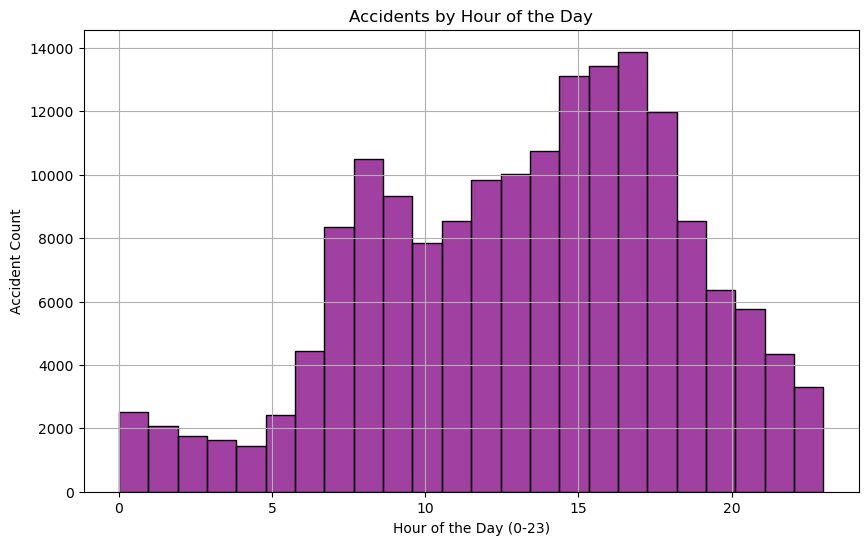

In [49]:
### 1. Analyze Accidents by Time of Day
plt.figure(figsize=(10, 6))
sns.histplot(df['Hour'], bins=24, kde=False, color='purple')
plt.title('Accidents by Hour of the Day')
plt.xlabel('Hour of the Day (0-23)')
plt.ylabel('Accident Count')
plt.grid(True)
plt.show()


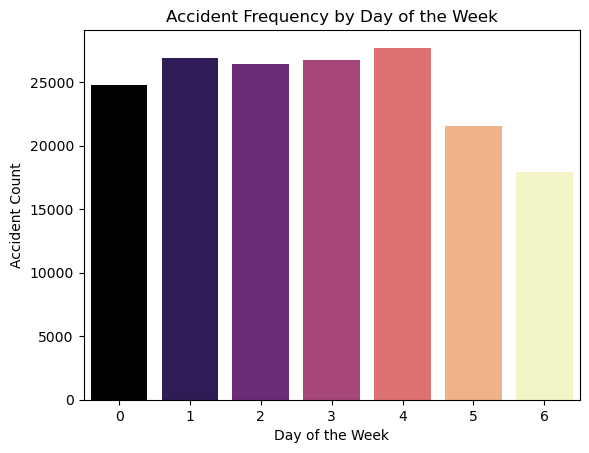

In [71]:
import seaborn as sns
import matplotlib.pyplot as plt

# Updated countplot with hue=x and legend=False
sns.countplot(x='DayOfWeek', data=df, hue='DayOfWeek', palette='magma', legend=False)

plt.title('Accident Frequency by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Accident Count')
plt.show()

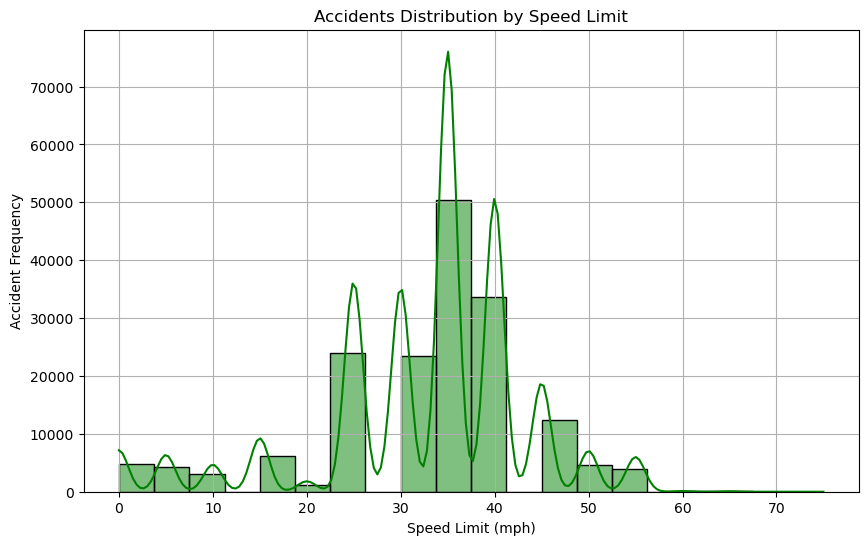

In [53]:
### 3. Analyze Speed Limit Impact
plt.figure(figsize=(10, 6))
sns.histplot(df['Speed Limit'], bins=20, kde=True, color='green')
plt.title('Accidents Distribution by Speed Limit')
plt.xlabel('Speed Limit (mph)')
plt.ylabel('Accident Frequency')
plt.grid(True)
plt.show()

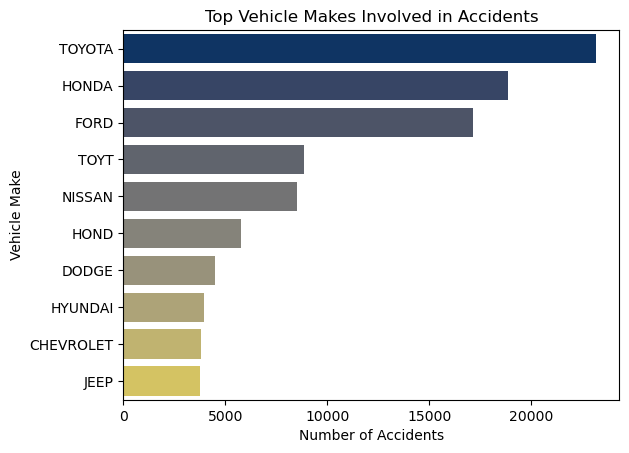

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'top_makes' is a Series with car makes as the index and their counts as values
sns.barplot(y=top_makes.index, x=top_makes.values, hue=top_makes.index, palette='cividis', legend=False)

plt.title('Top Vehicle Makes Involved in Accidents')
plt.xlabel('Number of Accidents')
plt.ylabel('Vehicle Make')
plt.show()

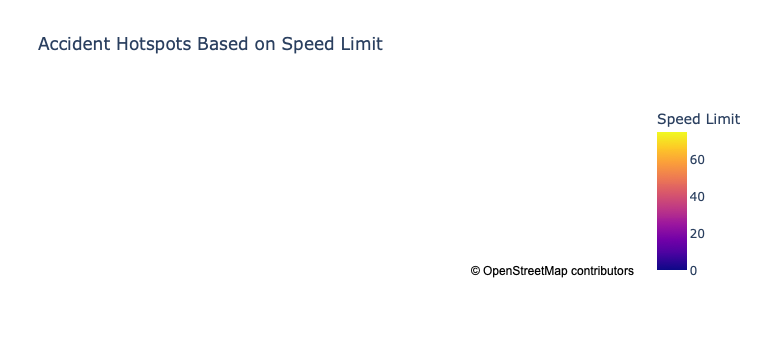

In [57]:
### 5. Visualize Accident Hotspots using Plotly
df = df.dropna(subset=['Latitude', 'Longitude'])

fig = px.density_mapbox(df,
                        lat='Latitude',
                        lon='Longitude',
                        z='Speed Limit',
                        radius=10,
                        center={"lat": 39.165, "lon": -77.249},  # Centered around the provided coordinates
                        zoom=8,
                        mapbox_style="open-street-map",
                        title='Accident Hotspots Based on Speed Limit')

fig.show()

In [59]:
### 6. Identify Factors Leading to Severe Accidents
severity_factors = ['Speed Limit', 'Vehicle Year', 'DayOfWeek', 'Hour']


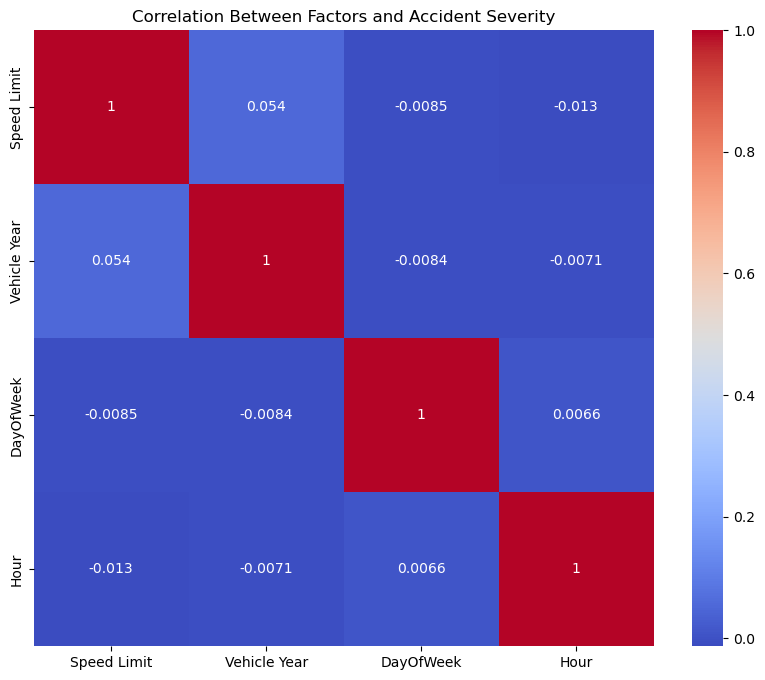

In [61]:
# Correlation Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(df[severity_factors].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Between Factors and Accident Severity')
plt.show()